# Import Libraries and Preprocess Data

In [3]:
!gdown '1x8Zm-c-kFLArxn-LFcBhYtHDBvKXDtTs'
!gdown '1Gn-BGkhNq8FCYtLE_BfAz5w0_jQl2Nji'
!gdown '1KTiKlbmtNP8XpG99PO5lj_DVNSp6yC2d'

Downloading...
From: https://drive.google.com/uc?id=1x8Zm-c-kFLArxn-LFcBhYtHDBvKXDtTs
To: /content/requirements.txt
100% 85.0/85.0 [00:00<00:00, 351kB/s]
Downloading...
From: https://drive.google.com/uc?id=1Gn-BGkhNq8FCYtLE_BfAz5w0_jQl2Nji
To: /content/coco.names
100% 705/705 [00:00<00:00, 2.01MB/s]
Downloading...
From: https://drive.google.com/uc?id=1KTiKlbmtNP8XpG99PO5lj_DVNSp6yC2d
To: /content/Test.mp4
100% 16.4M/16.4M [00:00<00:00, 37.0MB/s]


In [2]:
!pip install -q -r 'requirements.txt'

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.4/8.4 MB 31.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.7/92.7 kB 8.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 43.0 MB/s eta 0:00:00


In [ ]:
import os, sys, cv2, torch, datetime, torchreid
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.metrics.pairwise import cosine_similarity
from collections import defaultdict
from deep_sort_realtime.deepsort_tracker import DeepSort
from ultralytics import YOLOv10

/usr/local/lib/python3.10/dist-packages/torchreid/reid/metrics/rank.py:11: UserWarning: Cython evaluation (very fast so highly recommended) is unavailable, now use python evaluation.
  warnings.warn(


In [ ]:
video_path = "/content/drive/MyDrive/Realtime Tracking/Test.mp4"
if video_path.isdigit(): cap = cv2.VideoCapture(int(video_path))
else: cap = cv2.VideoCapture(video_path)

In [ ]:
classes_path = "/content/drive/MyDrive/Realtime Tracking/coco.names"
with open(classes_path, "r") as f:
    class_names = f.read().strip().split("\n")
class_names[:4]

['person', 'bicycle', 'car', 'motorbike']

In [ ]:
colors = np.random.randint(0, 255, size=(len(class_names), 3))

In [ ]:
device = (
    "cuda" if torch.cuda.is_available()
    else "mps" if torch.backends.mps.is_available()
    else "cpu"
)
print(f"Using {device} as processing device")

Using cpu as processing device


# Initialize YOLO

In [ ]:
!mkdir -p weights
!wget -P weights -q https://github.com/jameslahm/yolov10/releases/download/v1.0/yolov10n.pt

In [ ]:
model_path = "/content/weights/yolov10n.pt"
model = YOLOv10(model_path)
model.to(device)

YOLOv10(
  (model): YOLOv10DetectionModel(
    (model): Sequential(
      (0): Conv(
        (conv): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(16, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (1): Conv(
        (conv): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (2): C2f(
        (cv1): Conv(
          (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
          (act): SiLU(inplace=True)
        )
        (cv2): Conv(
          (conv): Conv2d(48, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track

# Initialize ReID Model

In [ ]:

# Load PCB model
def initialize_pcb_model():
    model_pcb = torchreid.models.build_model(
        name='pcb_p6',
        num_classes=1041,
        loss='softmax',
        pretrained=True
    )
    model_pcb = model_pcb.to(device)
    model_pcb.eval()
    return model_pcb

# Extract features for re-identification
def extract_features(model_pcb, img):
    if img is None or img.size == 0:
        return None

    img = Image.fromarray(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    transform = torchreid.data.transforms.build_transforms(
        height=256,
        width=128,
        transforms=['random_flip', 'random_crop', 'random_erase']
    )[1]

    img = transform(img).unsqueeze(0)
    img = img.to(device)

    with torch.no_grad():
        features = model_pcb(img)

    return features.cpu().numpy().squeeze()

pcb_model = initialize_pcb_model()

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 225MB/s]


# Process Frame

In [ ]:
# Function to check if two bounding boxes overlap
def is_overlap(bbox1, bbox2, threshold=0.5):
    x1, y1, x2, y2 = bbox1
    xx1, yy1, xx2, yy2 = bbox2

    xi1 = max(x1, xx1)
    yi1 = max(y1, yy1)
    xi2 = min(x2, xx2)
    yi2 = min(y2, yy2)

    inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)

    bbox1_area = (x2 - x1) * (y2 - y1)
    bbox2_area = (xx2 - xx1) * (yy2 - yy1)

    union_area = bbox1_area + bbox2_area - inter_area

    return inter_area / union_area > threshold

In [ ]:
def process_frame(frame, tracker, motorbike_owners, track_class_mapping):
    results = model(frame)[0]
    detections = []
    motorbikes = []
    persons = []

    for det in results.boxes:
        label, confidence, bbox = det.cls, det.conf, det.xyxy[0]
        x1, y1, x2, y2 = map(int, bbox)
        class_id = int(label)

        if confidence < 0.5: continue

        if class_id in [0, 1, 3]:
            detections.append([[x1, y1, x2 - x1, y2 - y1], confidence, class_id])
            if class_id == 0: persons.append([x1, y1, x2, y2])
            else: motorbikes.append([x1, y1, x2, y2])

    tracks = tracker.update_tracks(detections, frame=frame) # Tất cả các object detect được (Đã cho qua DeepSORT để lấy Bounding Box, class ID, và track ID)


    for track in tracks:
        if not track.is_confirmed(): continue

        # Get Class ID and Track ID
        class_id = track.get_det_class()
        track_id = track.track_id

        # Get color and coordinates of Bounding box
        color = colors[class_id]
        B, G, R = map(int, color)
        x1, y1, x2, y2 = map(int, track.to_ltrb())

        if track_id not in track_class_mapping: # Lưu ID chung cả xe và người
            track_class_mapping[track_id] = len(track_class_mapping) + 1

        if class_id == 1 or class_id == 3:  # Motorbike
            if track_class_mapping[track_id] not in motorbike_owners: # Nếu là xe mà ID chưa có trong motorbike_owners thì tạo một mảng mới để lưu owners của xe có ID đó
                motorbike_owners[track_class_mapping[track_id]] = []

                for person_bbox in persons:
                    if is_overlap([x1, y1, x2, y2], person_bbox):
                        cropped_img = frame[y1:y2, x1:x2]
                        new_features = extract_features(pcb_model, cropped_img)
                        if new_features is None:
                            continue
                        motorbike_owners[track_class_mapping[track_id]].append(new_features)

        elif class_id == 0:  # Person
            cropped_img = frame[y1:y2, x1:x2]
            new_features = extract_features(pcb_model, cropped_img)
            if new_features is None:
                continue

            matched = False
            for motorbike_id, owner_features in motorbike_owners.items():
                for saved_feature in owner_features:
                    similarity = cosine_similarity([new_features], [saved_feature])[0][0]
                    if similarity > 0.7:
                        matched = True
                        motorbike_owners[motorbike_id].append(new_features)
                        break
                # if not matched:
                #     if is_overlap([x1, y1, x2, y2], person_bbox): alert
                else: break

        text = f"{track_class_mapping[track_id]} - {class_names[class_id]}"
        cv2.rectangle(frame, (x1, y1), (x2, y2), (B, G, R), 2)
        cv2.rectangle(frame, (x1 - 1, y1 - 20), (x1 + len(text) * 12, y1), (B, G, R), -1)
        cv2.putText(frame, text, (x1 + 5, y1 - 8), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)

    plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

    plt.pause(0.1)
    writer.write(frame)


# Real-Time Processing Loop


0: 384x640 2 0s, 2 3s, 218.0ms
Speed: 5.2ms preprocess, 218.0ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)


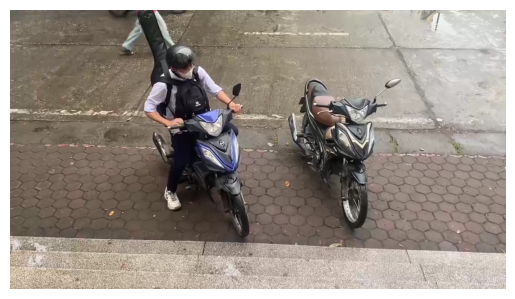


0: 384x640 1 0, 2 3s, 153.3ms
Speed: 2.6ms preprocess, 153.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)


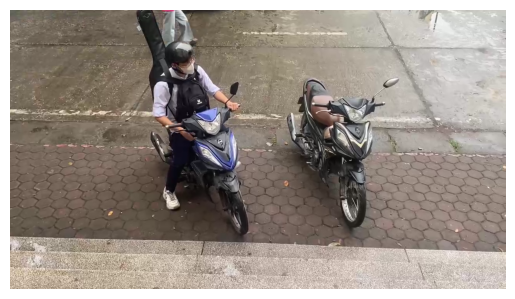


0: 384x640 2 0s, 2 3s, 158.5ms
Speed: 2.5ms preprocess, 158.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
Building train transforms ...
+ resize to 256x128
+ random flip
+ random crop (enlarge to 288x144 and crop 256x128)
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
+ random erase
Building test transforms ...
+ resize to 256x128
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
Building train transforms ...
+ resize to 256x128
+ random flip
+ random crop (enlarge to 288x144 and crop 256x128)
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
+ random erase
Building test transforms ...
+ resize to 256x128
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])


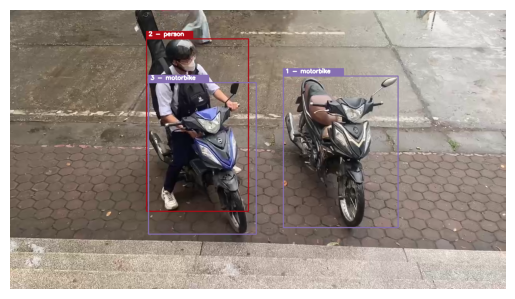


0: 384x640 2 0s, 2 3s, 163.4ms
Speed: 2.7ms preprocess, 163.4ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)
Building train transforms ...
+ resize to 256x128
+ random flip
+ random crop (enlarge to 288x144 and crop 256x128)
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
+ random erase
Building test transforms ...
+ resize to 256x128
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])


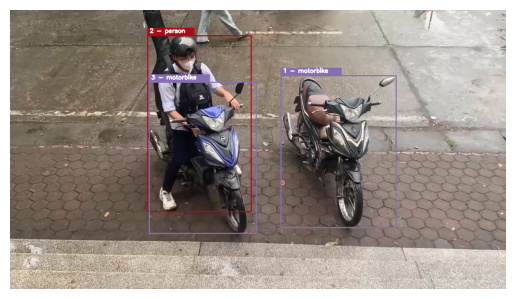


0: 384x640 2 0s, 2 3s, 241.8ms
Speed: 2.5ms preprocess, 241.8ms inference, 4.5ms postprocess per image at shape (1, 3, 384, 640)
Building train transforms ...
+ resize to 256x128
+ random flip
+ random crop (enlarge to 288x144 and crop 256x128)
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
+ random erase
Building test transforms ...
+ resize to 256x128
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])


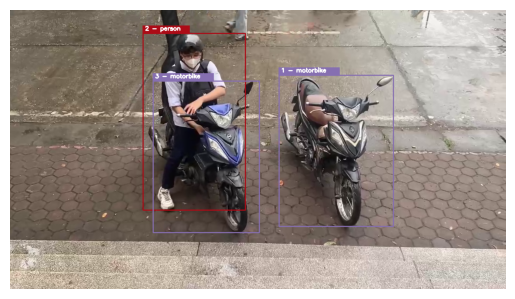


0: 384x640 2 0s, 2 3s, 259.2ms
Speed: 2.7ms preprocess, 259.2ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)
Building train transforms ...
+ resize to 256x128
+ random flip
+ random crop (enlarge to 288x144 and crop 256x128)
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
+ random erase
Building test transforms ...
+ resize to 256x128
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])


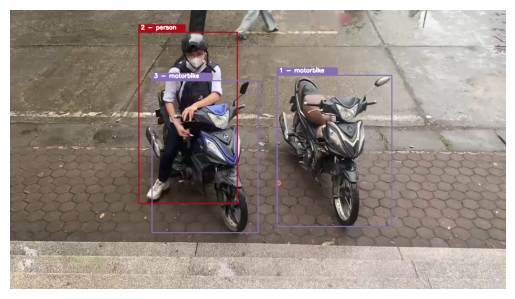


0: 384x640 1 0, 2 3s, 256.0ms
Speed: 9.6ms preprocess, 256.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)
Building train transforms ...
+ resize to 256x128
+ random flip
+ random crop (enlarge to 288x144 and crop 256x128)
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
+ random erase
Building test transforms ...
+ resize to 256x128
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])


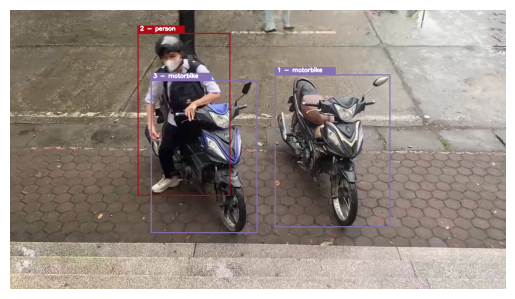


0: 384x640 1 0, 2 3s, 269.9ms
Speed: 2.5ms preprocess, 269.9ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)
Building train transforms ...
+ resize to 256x128
+ random flip
+ random crop (enlarge to 288x144 and crop 256x128)
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
+ random erase
Building test transforms ...
+ resize to 256x128
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])


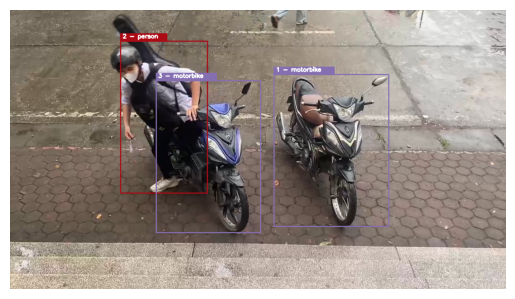


0: 384x640 1 0, 2 3s, 154.4ms
Speed: 3.0ms preprocess, 154.4ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)
Building train transforms ...
+ resize to 256x128
+ random flip
+ random crop (enlarge to 288x144 and crop 256x128)
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
+ random erase
Building test transforms ...
+ resize to 256x128
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])


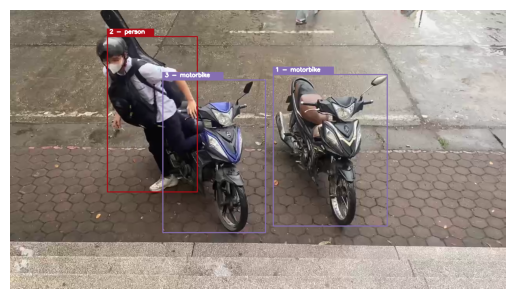


0: 384x640 1 0, 2 3s, 157.7ms
Speed: 4.1ms preprocess, 157.7ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)
Building train transforms ...
+ resize to 256x128
+ random flip
+ random crop (enlarge to 288x144 and crop 256x128)
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
+ random erase
Building test transforms ...
+ resize to 256x128
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])


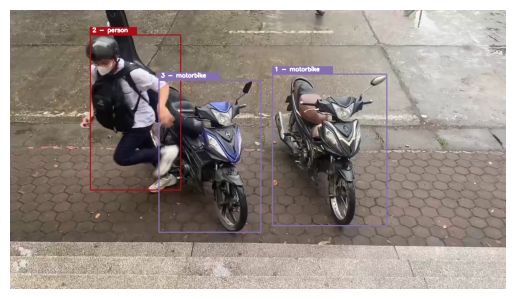


0: 384x640 1 0, 2 3s, 159.1ms
Speed: 2.5ms preprocess, 159.1ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)
Building train transforms ...
+ resize to 256x128
+ random flip
+ random crop (enlarge to 288x144 and crop 256x128)
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
+ random erase
Building test transforms ...
+ resize to 256x128
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])


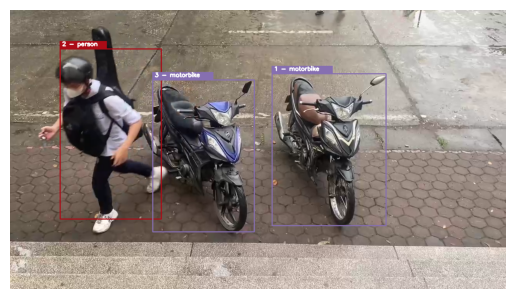


0: 384x640 1 0, 2 3s, 153.0ms
Speed: 8.7ms preprocess, 153.0ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)
Building train transforms ...
+ resize to 256x128
+ random flip
+ random crop (enlarge to 288x144 and crop 256x128)
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
+ random erase
Building test transforms ...
+ resize to 256x128
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])


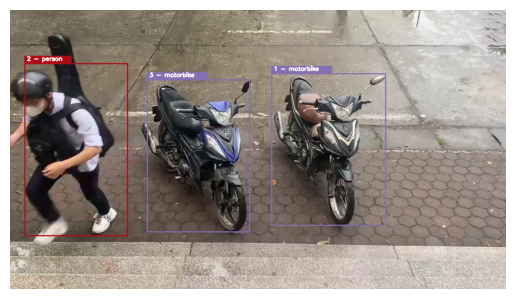


0: 384x640 2 0s, 2 3s, 159.2ms
Speed: 2.5ms preprocess, 159.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)


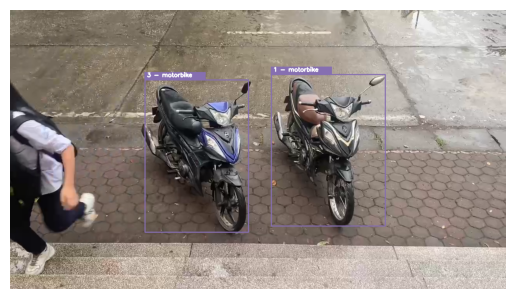


0: 384x640 1 0, 3 3s, 178.7ms
Speed: 4.3ms preprocess, 178.7ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


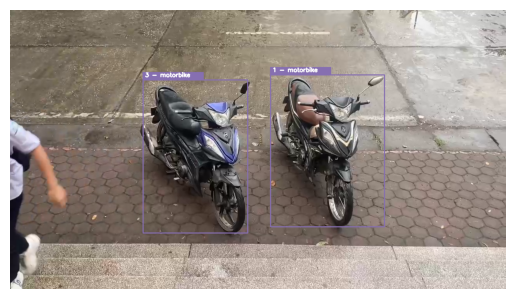


0: 384x640 2 3s, 174.0ms
Speed: 3.7ms preprocess, 174.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)


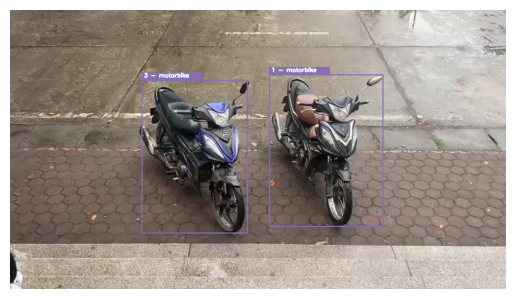


0: 384x640 1 0, 2 3s, 170.8ms
Speed: 2.6ms preprocess, 170.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


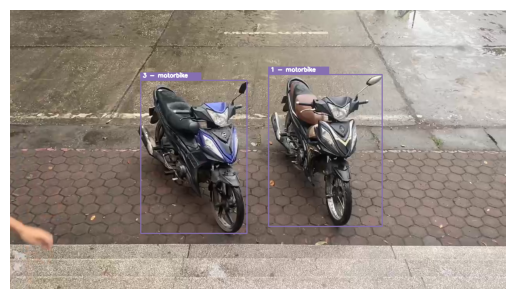


0: 384x640 2 3s, 168.8ms
Speed: 2.8ms preprocess, 168.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


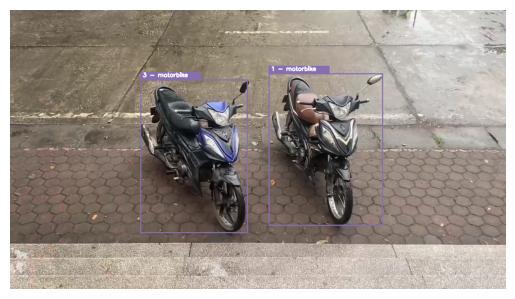


0: 384x640 2 3s, 200.2ms
Speed: 7.0ms preprocess, 200.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)


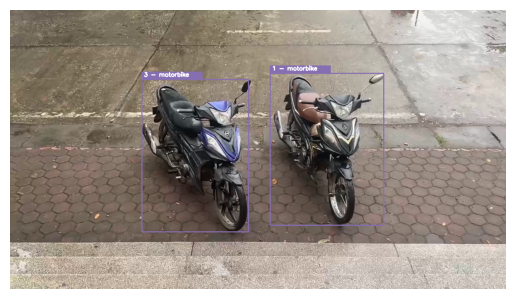


0: 384x640 2 3s, 170.8ms
Speed: 2.6ms preprocess, 170.8ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


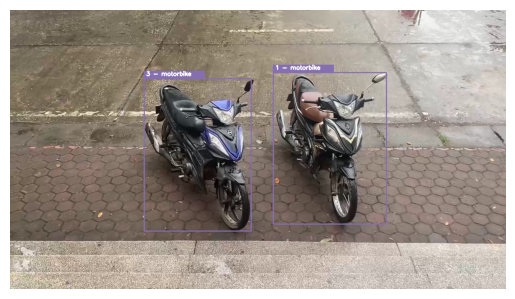


0: 384x640 2 3s, 239.4ms
Speed: 3.7ms preprocess, 239.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
Building train transforms ...
+ resize to 256x128
+ random flip
+ random crop (enlarge to 288x144 and crop 256x128)
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
+ random erase
Building test transforms ...
+ resize to 256x128
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])


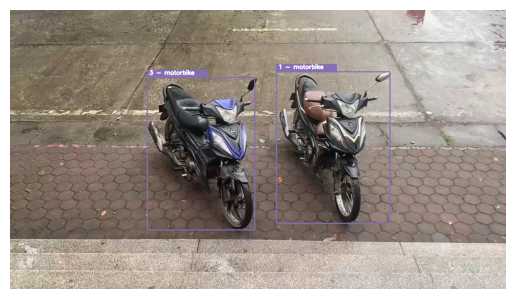


0: 384x640 2 3s, 240.7ms
Speed: 2.5ms preprocess, 240.7ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)
Building train transforms ...
+ resize to 256x128
+ random flip
+ random crop (enlarge to 288x144 and crop 256x128)
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
+ random erase
Building test transforms ...
+ resize to 256x128
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])


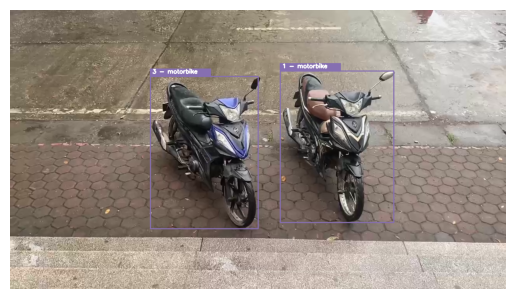


0: 384x640 2 3s, 249.5ms
Speed: 2.6ms preprocess, 249.5ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)
Building train transforms ...
+ resize to 256x128
+ random flip
+ random crop (enlarge to 288x144 and crop 256x128)
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
+ random erase
Building test transforms ...
+ resize to 256x128
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])


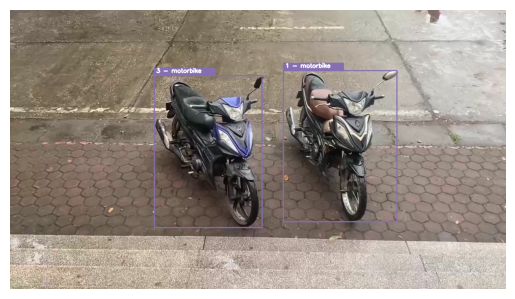


0: 384x640 2 3s, 270.7ms
Speed: 6.8ms preprocess, 270.7ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)
Building train transforms ...
+ resize to 256x128
+ random flip
+ random crop (enlarge to 288x144 and crop 256x128)
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
+ random erase
Building test transforms ...
+ resize to 256x128
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])


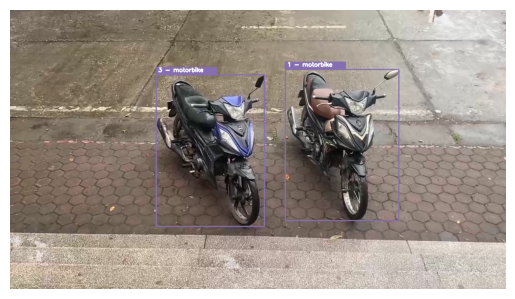


0: 384x640 2 3s, 298.0ms
Speed: 2.6ms preprocess, 298.0ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)
Building train transforms ...
+ resize to 256x128
+ random flip
+ random crop (enlarge to 288x144 and crop 256x128)
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
+ random erase
Building test transforms ...
+ resize to 256x128
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])


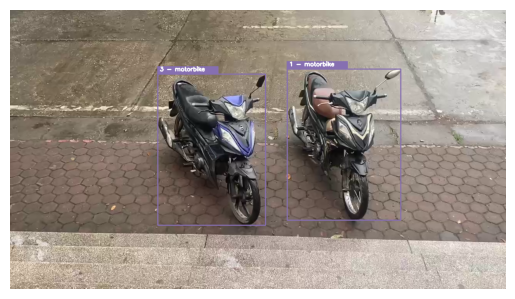


0: 384x640 2 3s, 257.7ms
Speed: 3.6ms preprocess, 257.7ms inference, 3.2ms postprocess per image at shape (1, 3, 384, 640)


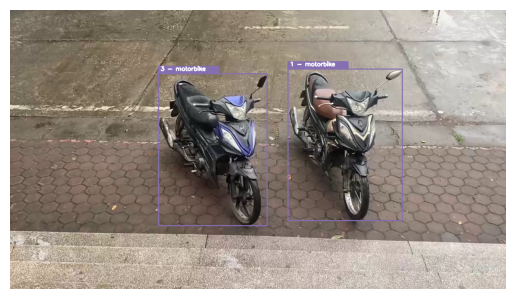


0: 384x640 2 3s, 191.0ms
Speed: 4.6ms preprocess, 191.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


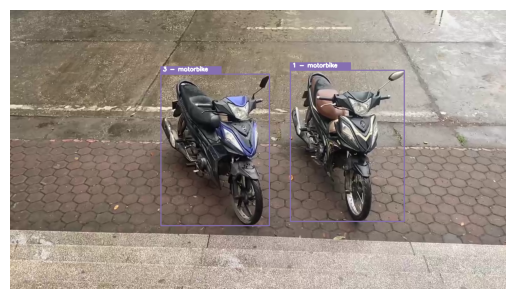


0: 384x640 2 3s, 180.3ms
Speed: 2.5ms preprocess, 180.3ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


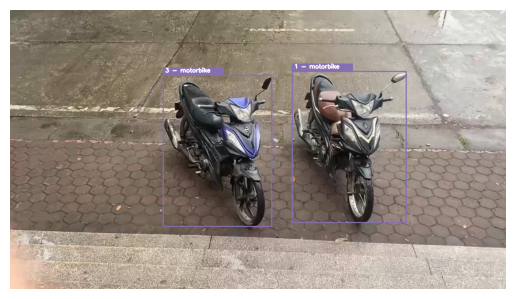


0: 384x640 2 3s, 183.9ms
Speed: 3.9ms preprocess, 183.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


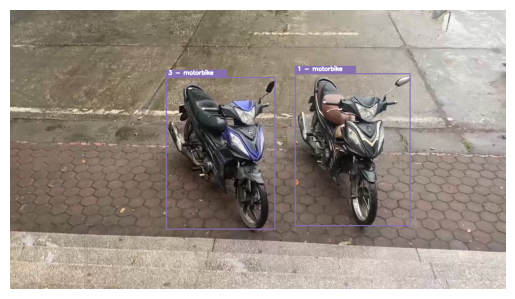


0: 384x640 2 3s, 183.1ms
Speed: 7.6ms preprocess, 183.1ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


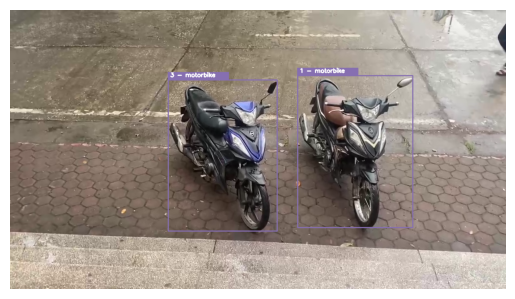


0: 384x640 1 0, 2 3s, 207.9ms
Speed: 3.1ms preprocess, 207.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


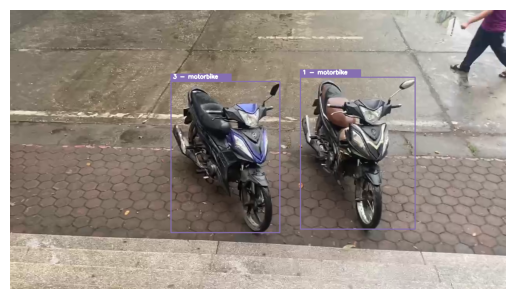


0: 384x640 1 0, 2 3s, 200.8ms
Speed: 5.2ms preprocess, 200.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


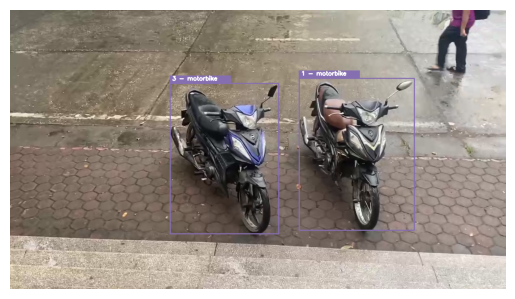


0: 384x640 1 0, 2 3s, 194.7ms
Speed: 7.4ms preprocess, 194.7ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


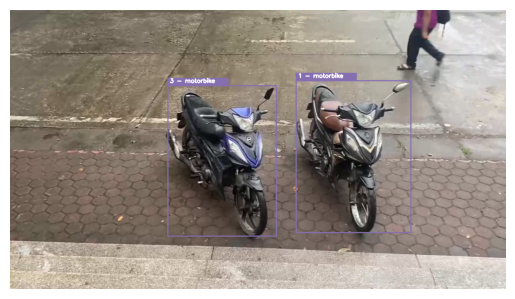


0: 384x640 1 0, 2 3s, 189.7ms
Speed: 3.6ms preprocess, 189.7ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


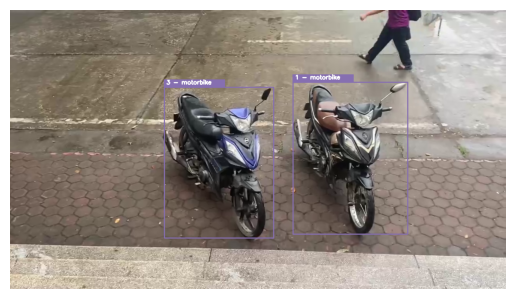


0: 384x640 1 0, 2 3s, 191.7ms
Speed: 2.6ms preprocess, 191.7ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


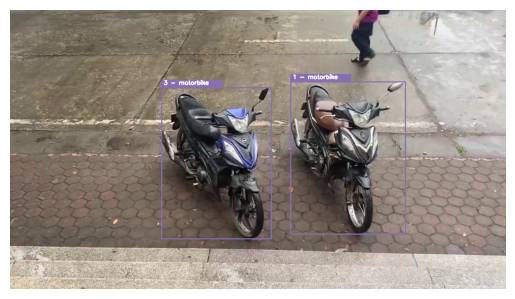


0: 384x640 1 0, 2 3s, 215.3ms
Speed: 5.8ms preprocess, 215.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


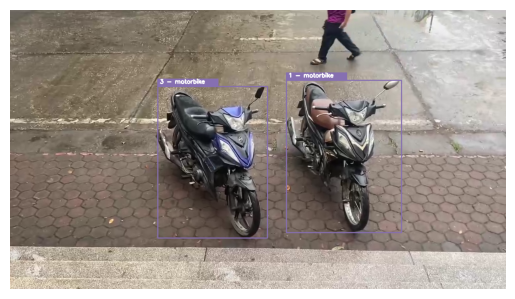


0: 384x640 1 0, 2 3s, 205.3ms
Speed: 2.7ms preprocess, 205.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


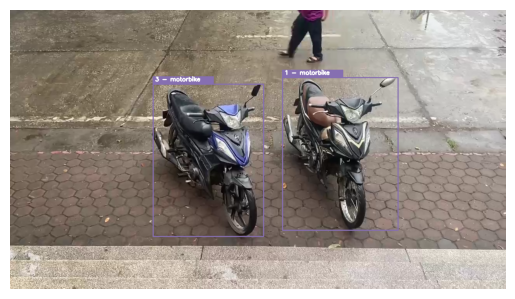


0: 384x640 1 0, 2 3s, 1 26, 273.3ms
Speed: 7.3ms preprocess, 273.3ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)


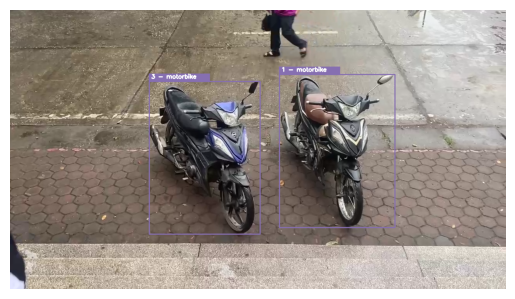


0: 384x640 2 0s, 2 3s, 248.0ms
Speed: 3.6ms preprocess, 248.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)


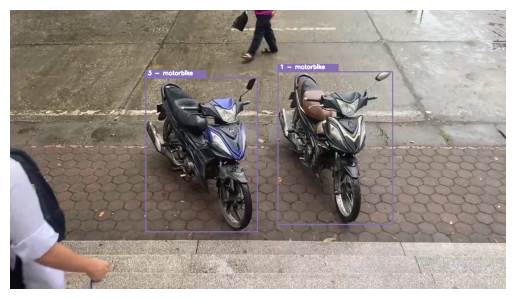


0: 384x640 2 0s, 2 3s, 259.3ms
Speed: 2.6ms preprocess, 259.3ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)


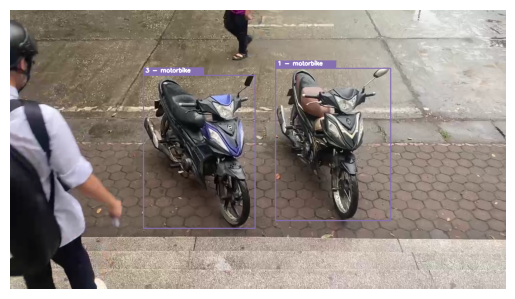


0: 384x640 2 0s, 2 3s, 240.0ms
Speed: 2.5ms preprocess, 240.0ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)


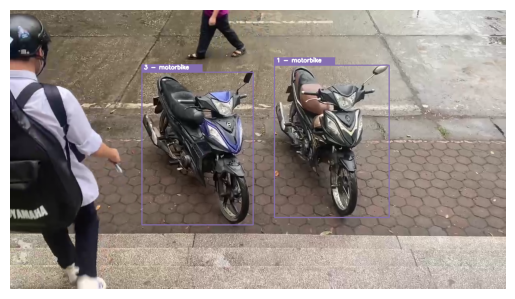


0: 384x640 2 0s, 2 3s, 315.9ms
Speed: 2.7ms preprocess, 315.9ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


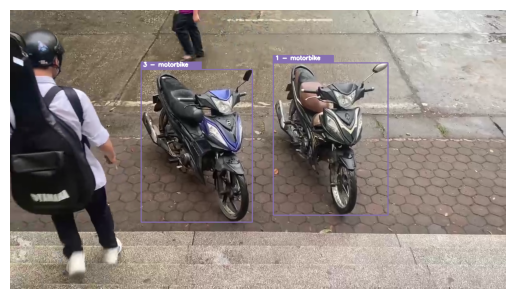


0: 384x640 2 0s, 2 3s, 1 24, 261.4ms
Speed: 8.0ms preprocess, 261.4ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)


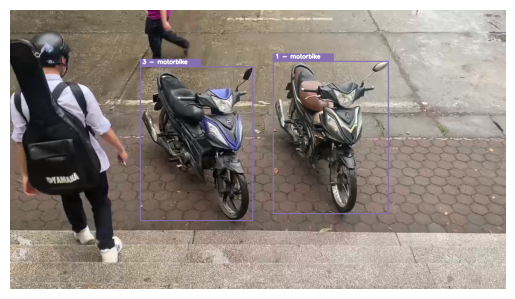


0: 384x640 2 0s, 2 3s, 1 24, 256.5ms
Speed: 7.5ms preprocess, 256.5ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)


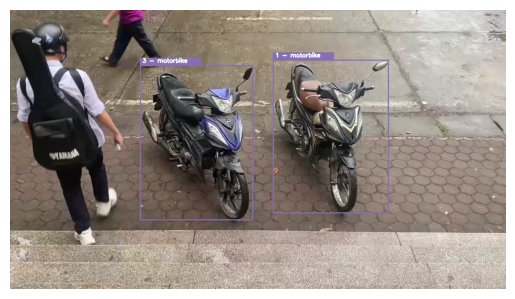


0: 384x640 2 0s, 2 3s, 1 24, 316.6ms
Speed: 4.4ms preprocess, 316.6ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)
Building train transforms ...
+ resize to 256x128
+ random flip
+ random crop (enlarge to 288x144 and crop 256x128)
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
+ random erase
Building test transforms ...
+ resize to 256x128
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])


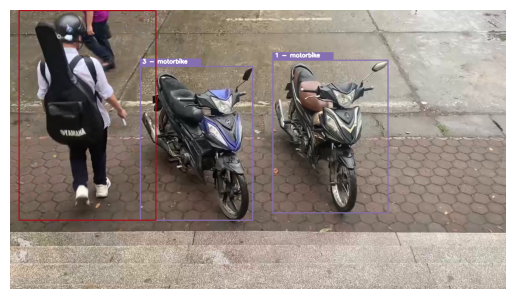


0: 384x640 1 0, 2 3s, 1 24, 220.4ms
Speed: 2.6ms preprocess, 220.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


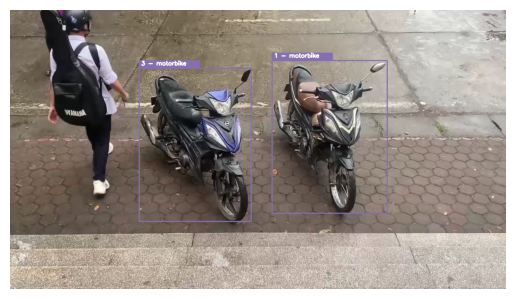


0: 384x640 2 0s, 2 3s, 211.9ms
Speed: 6.6ms preprocess, 211.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)


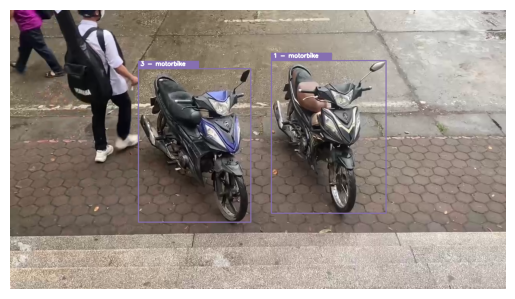


0: 384x640 2 0s, 2 3s, 217.2ms
Speed: 5.4ms preprocess, 217.2ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


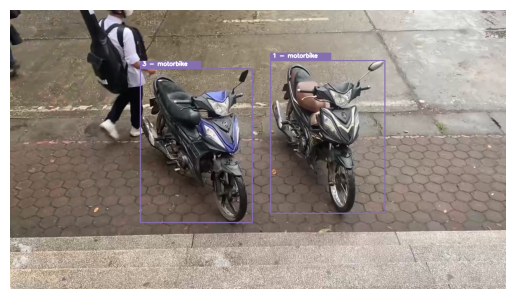


0: 384x640 2 0s, 2 3s, 1 24, 223.5ms
Speed: 5.0ms preprocess, 223.5ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)


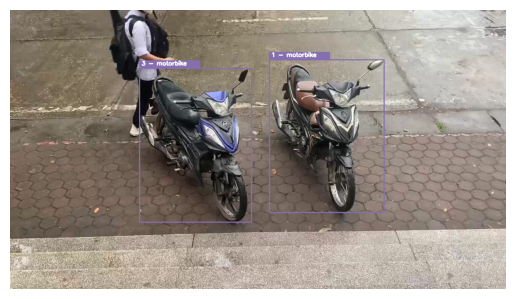


0: 384x640 2 3s, 2 24s, 215.9ms
Speed: 3.8ms preprocess, 215.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


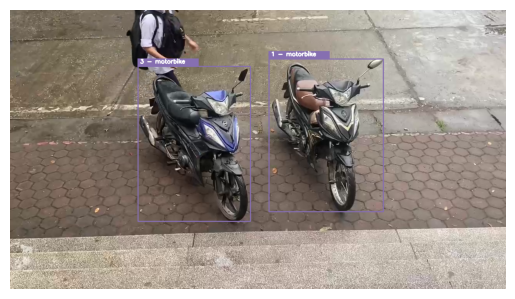


0: 384x640 1 0, 2 3s, 1 24, 232.8ms
Speed: 3.4ms preprocess, 232.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


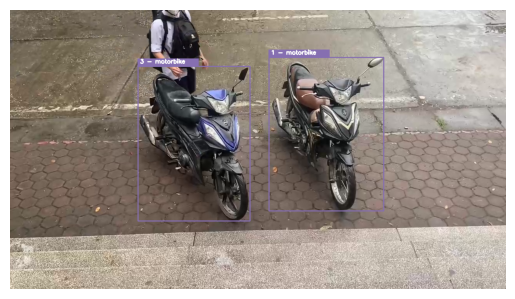


0: 384x640 1 0, 2 3s, 236.5ms
Speed: 2.6ms preprocess, 236.5ms inference, 3.8ms postprocess per image at shape (1, 3, 384, 640)


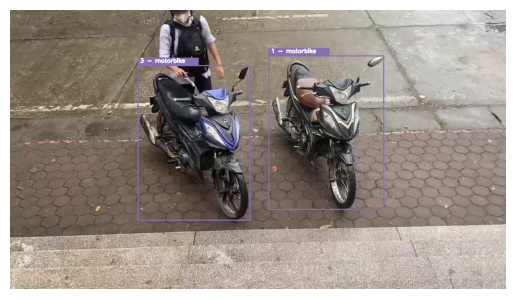


0: 384x640 1 0, 2 3s, 226.7ms
Speed: 5.4ms preprocess, 226.7ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


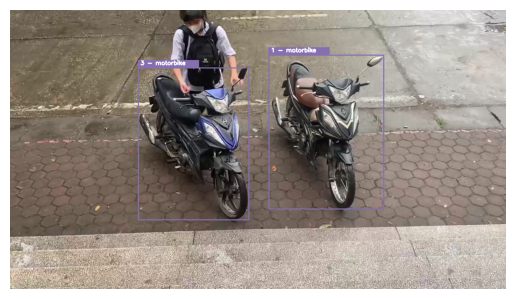


0: 384x640 1 0, 2 3s, 474.9ms
Speed: 6.9ms preprocess, 474.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
Building train transforms ...
+ resize to 256x128
+ random flip
+ random crop (enlarge to 288x144 and crop 256x128)
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
+ random erase
Building test transforms ...
+ resize to 256x128
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])


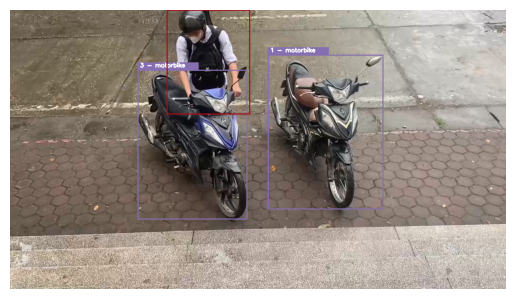


0: 384x640 1 0, 2 3s, 1 24, 323.9ms
Speed: 2.6ms preprocess, 323.9ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)
Building train transforms ...
+ resize to 256x128
+ random flip
+ random crop (enlarge to 288x144 and crop 256x128)
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
+ random erase
Building test transforms ...
+ resize to 256x128
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])


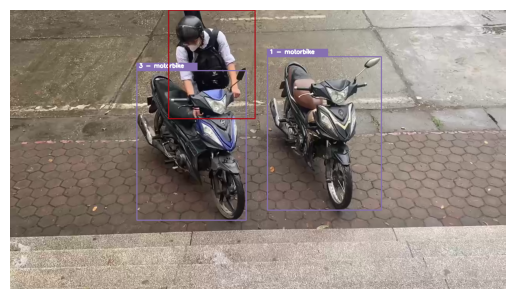


0: 384x640 1 0, 2 3s, 1 24, 268.2ms
Speed: 5.6ms preprocess, 268.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)
Building train transforms ...
+ resize to 256x128
+ random flip
+ random crop (enlarge to 288x144 and crop 256x128)
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
+ random erase
Building test transforms ...
+ resize to 256x128
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])


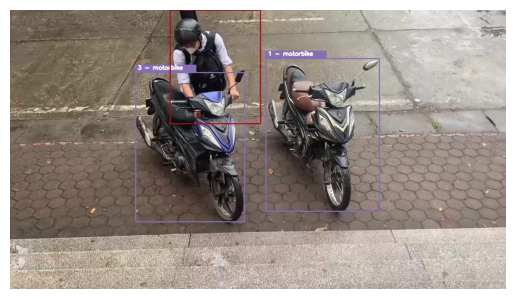


0: 384x640 1 0, 2 3s, 346.6ms
Speed: 2.7ms preprocess, 346.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


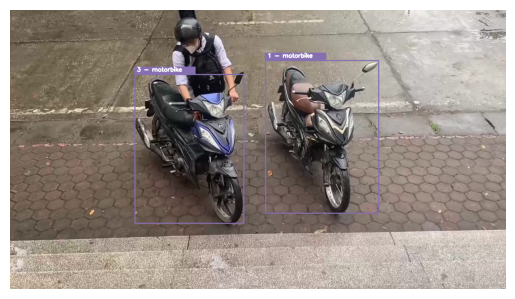


0: 384x640 2 0s, 2 3s, 280.2ms
Speed: 3.2ms preprocess, 280.2ms inference, 3.3ms postprocess per image at shape (1, 3, 384, 640)
Building train transforms ...
+ resize to 256x128
+ random flip
+ random crop (enlarge to 288x144 and crop 256x128)
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
+ random erase
Building test transforms ...
+ resize to 256x128
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
Building train transforms ...
+ resize to 256x128
+ random flip
+ random crop (enlarge to 288x144 and crop 256x128)
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
+ random erase
Building test transforms ...
+ resize to 256x128
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])


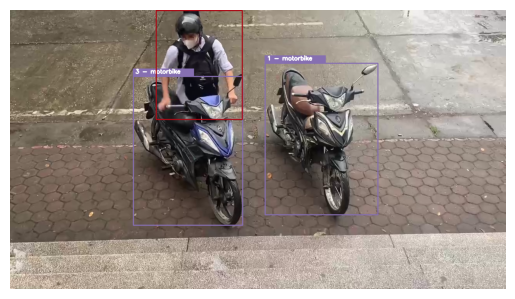


0: 384x640 1 0, 2 3s, 1 24, 250.6ms
Speed: 6.6ms preprocess, 250.6ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)
Building train transforms ...
+ resize to 256x128
+ random flip
+ random crop (enlarge to 288x144 and crop 256x128)
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
+ random erase
Building test transforms ...
+ resize to 256x128
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
Building train transforms ...
+ resize to 256x128
+ random flip
+ random crop (enlarge to 288x144 and crop 256x128)
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
+ random erase
Building test transforms ...
+ resize to 256x128
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])


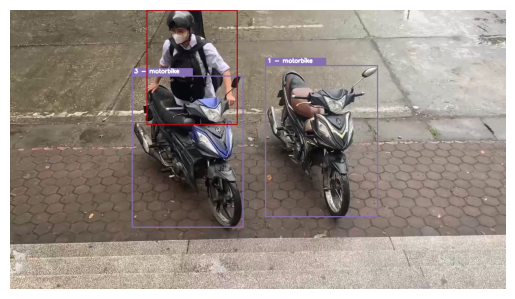


0: 384x640 1 0, 2 3s, 1 24, 248.5ms
Speed: 2.6ms preprocess, 248.5ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)
Building train transforms ...
+ resize to 256x128
+ random flip
+ random crop (enlarge to 288x144 and crop 256x128)
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
+ random erase
Building test transforms ...
+ resize to 256x128
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])


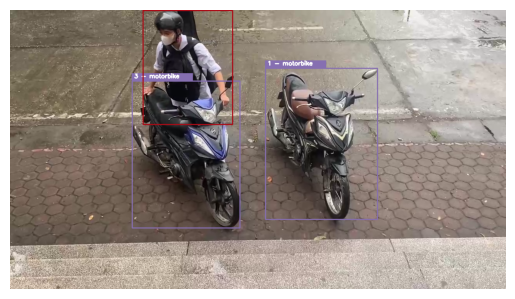


0: 384x640 1 0, 2 3s, 1 24, 224.8ms
Speed: 2.6ms preprocess, 224.8ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)
Building train transforms ...
+ resize to 256x128
+ random flip
+ random crop (enlarge to 288x144 and crop 256x128)
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
+ random erase
Building test transforms ...
+ resize to 256x128
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])


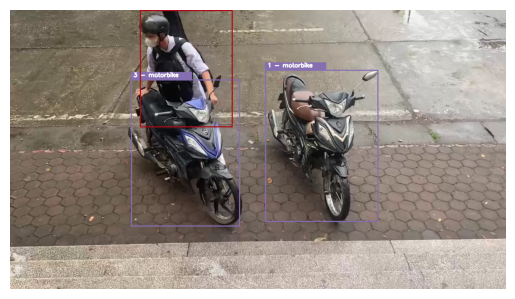


0: 384x640 1 0, 2 3s, 235.4ms
Speed: 5.3ms preprocess, 235.4ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)
Building train transforms ...
+ resize to 256x128
+ random flip
+ random crop (enlarge to 288x144 and crop 256x128)
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
+ random erase
Building test transforms ...
+ resize to 256x128
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])


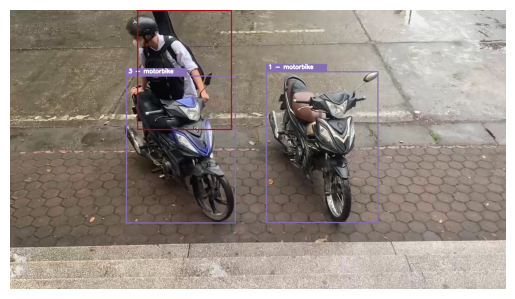


0: 384x640 1 0, 2 3s, 1 24, 221.9ms
Speed: 4.8ms preprocess, 221.9ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)
Building train transforms ...
+ resize to 256x128
+ random flip
+ random crop (enlarge to 288x144 and crop 256x128)
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
+ random erase
Building test transforms ...
+ resize to 256x128
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])


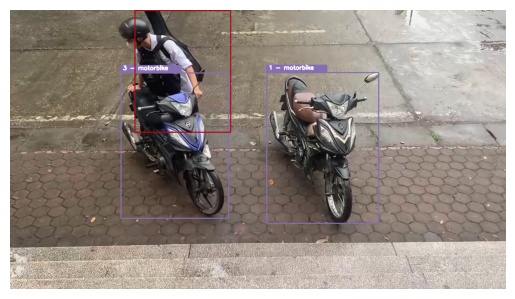


0: 384x640 1 0, 2 3s, 253.5ms
Speed: 2.5ms preprocess, 253.5ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)
Building train transforms ...
+ resize to 256x128
+ random flip
+ random crop (enlarge to 288x144 and crop 256x128)
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
+ random erase
Building test transforms ...
+ resize to 256x128
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])


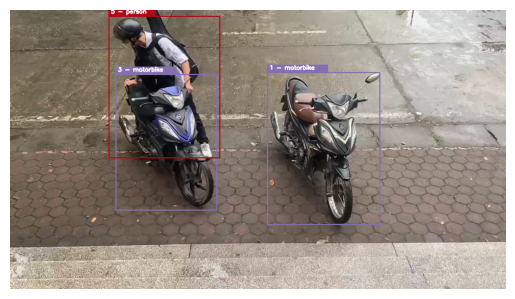


0: 384x640 1 0, 2 3s, 222.0ms
Speed: 6.9ms preprocess, 222.0ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)
Building train transforms ...
+ resize to 256x128
+ random flip
+ random crop (enlarge to 288x144 and crop 256x128)
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
+ random erase
Building test transforms ...
+ resize to 256x128
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])


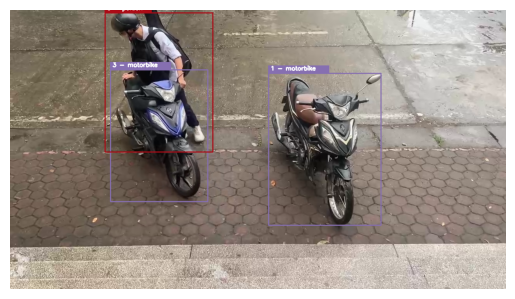


0: 384x640 1 0, 2 3s, 232.7ms
Speed: 9.2ms preprocess, 232.7ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)
Building train transforms ...
+ resize to 256x128
+ random flip
+ random crop (enlarge to 288x144 and crop 256x128)
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
+ random erase
Building test transforms ...
+ resize to 256x128
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])


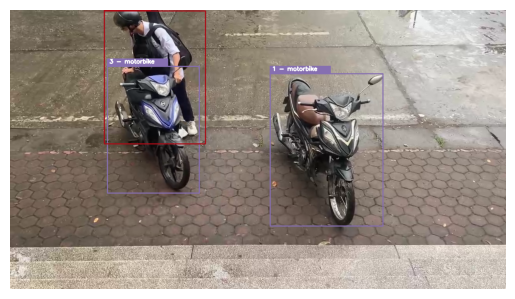


0: 384x640 1 0, 2 3s, 220.8ms
Speed: 2.8ms preprocess, 220.8ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)
Building train transforms ...
+ resize to 256x128
+ random flip
+ random crop (enlarge to 288x144 and crop 256x128)
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
+ random erase
Building test transforms ...
+ resize to 256x128
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])


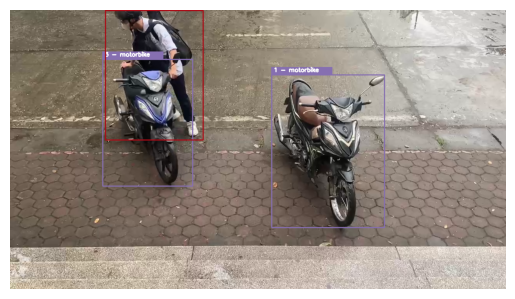


0: 384x640 1 0, 2 3s, 284.0ms
Speed: 2.9ms preprocess, 284.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)
Building train transforms ...
+ resize to 256x128
+ random flip
+ random crop (enlarge to 288x144 and crop 256x128)
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
+ random erase
Building test transforms ...
+ resize to 256x128
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])


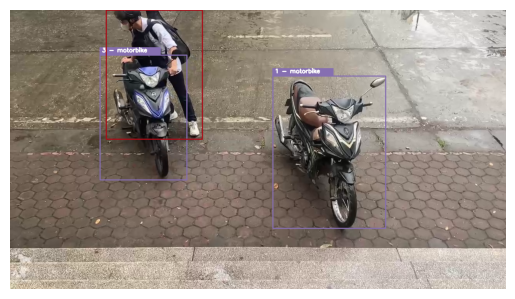


0: 384x640 1 0, 2 3s, 304.9ms
Speed: 9.5ms preprocess, 304.9ms inference, 4.1ms postprocess per image at shape (1, 3, 384, 640)
Building train transforms ...
+ resize to 256x128
+ random flip
+ random crop (enlarge to 288x144 and crop 256x128)
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
+ random erase
Building test transforms ...
+ resize to 256x128
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])


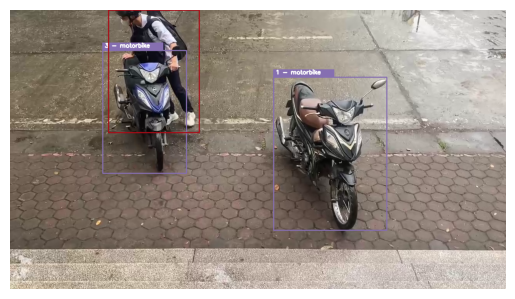


0: 384x640 1 0, 2 3s, 260.1ms
Speed: 2.7ms preprocess, 260.1ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)
Building train transforms ...
+ resize to 256x128
+ random flip
+ random crop (enlarge to 288x144 and crop 256x128)
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
+ random erase
Building test transforms ...
+ resize to 256x128
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])


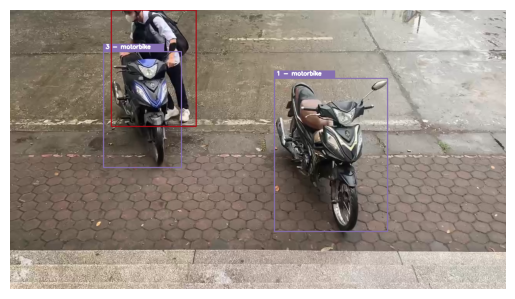


0: 384x640 1 0, 2 3s, 241.6ms
Speed: 2.5ms preprocess, 241.6ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)
Building train transforms ...
+ resize to 256x128
+ random flip
+ random crop (enlarge to 288x144 and crop 256x128)
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
+ random erase
Building test transforms ...
+ resize to 256x128
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])


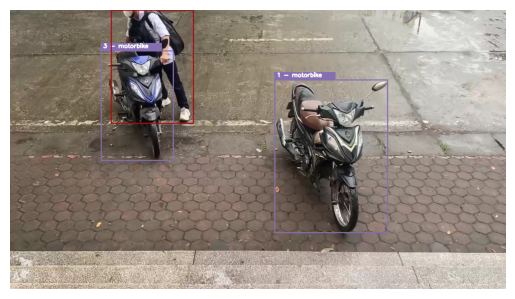


0: 384x640 2 0s, 2 3s, 265.6ms
Speed: 2.7ms preprocess, 265.6ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)
Building train transforms ...
+ resize to 256x128
+ random flip
+ random crop (enlarge to 288x144 and crop 256x128)
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
+ random erase
Building test transforms ...
+ resize to 256x128
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])


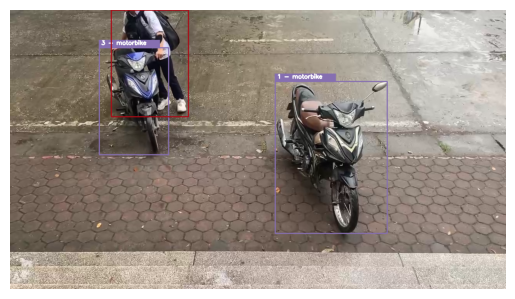


0: 384x640 1 0, 2 3s, 1 24, 250.5ms
Speed: 2.5ms preprocess, 250.5ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)
Building train transforms ...
+ resize to 256x128
+ random flip
+ random crop (enlarge to 288x144 and crop 256x128)
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
+ random erase
Building test transforms ...
+ resize to 256x128
+ to torch tensor of range [0, 1]
+ normalization (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])


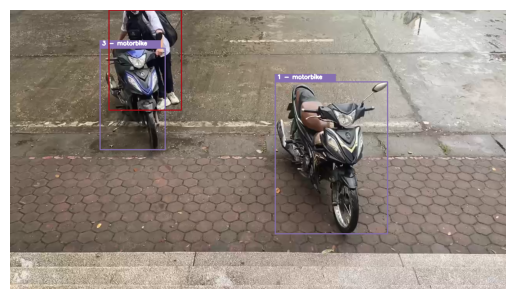

KeyboardInterrupt: 

In [ ]:
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(cap.get(cv2.CAP_PROP_FPS))
writer = cv2.VideoWriter("/content/video.mp4", cv2.VideoWriter_fourcc(*"mp4v"), fps, (frame_width, frame_height))

tracker = DeepSort(max_age=10)
motorbike_owners = {}  # Mapping of motorbike ID to owner features
track_class_mapping = {} # This ensures every track_id is assigned a unique ID if it doesn't exist in track_class_mapping.

i = 0
while True:
    i+=1
    ret, frame = cap.read()
    # print(i)
    if not ret: break
    if i%10==0: process_frame(frame, tracker, motorbike_owners, track_class_mapping)
    if cv2.waitKey(1) == ord("q"): break

cap.release()
writer.release()
cv2.destroyAllWindows()